# 2.3. Complex Machine Learning Models and Keras Part 2

## This script contains the following points:
### 1. Import libraries and data sets.
### 2. Split data by 2000s and transform data sets into the correct shape to feed to the deep learning model.
### 3. Create and run random forest model and print accuracy for 2000s. Plot decision trees 
### 4. Find which weather stations have the most influence on how the random forest divides up data.
### 5. Create three subsets of original data set (including all decades): One subset for each of the top three most important stations from Section 4 directly above.
### 6. Create another random forest model for each of the 3 stations from Section 5 and graph the importance of the observations

## 01. Import libraries and data sets.

In [1]:
# Import libraries.

import pandas as pd
import numpy as np
import seaborn as sns
import os
import operator
import datetime as dt
import matplotlib.pyplot as plt
import tensorflow as tf
from sklearn import datasets
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from numpy import argmax
from sklearn import metrics  
from sklearn.tree import plot_tree
from sklearn import tree

In [2]:
# Supress scientific notation for easier analysis profiling
pd.set_option('display.float_format', '{:.2f}'.format)

# Set display options to show all columns without truncation
pd.set_option('display.max_columns', None)

In [3]:
# Create path
path = r'C:\Users\Quinn\Documents\CF - Data Analysis\Machine Learning\ClimateWins'

In [4]:
# Import the cleaned dataset
climate = pd.read_csv(os.path.join(path, '02 Data Sets', 'cleaned_climate.csv'))
climate.head(5)

,Unnamed: 0,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressure,STOCKHOLM_humidity
0,0,19600101,1,7,0.85,1.02,0.32,0.09,0.70,6.50,0.80,10.90,1,0.81,1.02,0.88,0.00,7.00,3.70,-0.90,7.90,4,0.67,1.02,0.44,0.01,2.30,2.40,-0.40,5.10,7,0.85,1.00,0.07,0.25,0.00,9.30,7.40,11.00,8,0.83,1.02,0.12,0.08,0.00,10.00,7.00,11.50,7,0.91,1.00,0.13,0.22,0.00,10.60,9.40,8.30,0.82,1.01,0.28,0.48,1.60,7.90,3.90,9.40,8,1.00,1.02,0.20,0.00,0.00,-0.60,-1.90,0.50,7,0.83,1.01,0.22,0.32,1.00,9.50,8.50,11.10,6,0.92,1.03,0.53,0.00,1.40,7.60,4.40,10.80,5,0.67,0.20,0.10,0.00,6.90,1.10,10.40,8,0.98,1.00,0.04,1.14,0.00,4.90,3.80,5.90,4,0.73,1.03,0.48,0.01,2.30,-5.90,-8.50,-3.20,5,1.01,0.05,0.32,0.00,4.20,2.20,4.90,5,0.88,1.00,0.45,0.34,4.70,8.50,6.00,10.90,8,1.03,0.98
1,1,19600102,1,6,0.84,1.02,0.36,1.05,1.10,6.10,3.30,10.10,6,0.84,1.02,0.25,0.00,0.00,2.90,2.20,4.40,4,0.67,1.02,0.18,0.31,0.00,2.30,1.40,3.10,8,0.90,1.01,0.14,0.06,0.10,7.70,6.40,8.30,8,0.89,1.02,0.18,0.66,0.50,8.20,7.40,11.00,7,0.98,1.01,0.13,0.23,0.00,6.10,3.90,10.60,0.86,1.01,0.12,0.27,0.00,7.70,6.80,9.10,6,0.94,1.02,0.56,0.13,3.20,2.10,-1.30,5.50,8,0.92,1.01,0.17,1.34,0.40,8.60,7.50,9.90,7,0.86,1.03,0.46,0.00,0.90,9.80,7.40,12.20,6,0.72,0.61,0.30,5.10,6.20,4.20,10.20,8,0.62,1.01,0.04,0.00,0.00,3.40,2.80,4.90,6,0.97,1.03,0.21,0.61,0.00,-9.50,-10.50,-8.50,5,1.01,0.05,0.06,0.00,4.00,3.00,5.00,7,0.91,1.00,0.25,0.84,0.70,8.90,5.60,12.10,6,1.03,0.62
2,2,19600103,1,8,0.90,1.02,0.

In [5]:
# Import the pleasant dataset
pleasant = pd.read_csv(os.path.join(path, '02 Data Sets', 'Dataset-Answers-Weather_Prediction_Pleasant_Weather.csv'))
pleasant.head(5)

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


## 02. Split data by 2000s and transform data sets into the correct shape to feed to the deep learning model.

In [6]:
# Split the observations dataset
climate_decade = climate[climate['DATE'].astype(str).str.startswith('200')] #<-----INSERT YEAR HERE
climate_decade

,Unnamed: 0,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressure,STOCKHOLM_humidity
14610,14610,20000101,1,8,0.89,1.03,0.20,0.03,0.00,2.90,1.60,3.90,7,0.88,1.03,0.24,0.00,0.00,-2.50,-3.20,-0.40,3,0.92,1.03,0.52,0.00,3.70,-4.90,-8.40,-0.70,7,0.97,1.02,0.14,0.10,0.00,6.10,3.50,8.10,8,0.92,1.02,0.12,0.22,0.00,4.20,2.50,6.90,7,0.94,1.02,0.18,0.00,0.40,7.00,4.90,10.80,0.93,1.02,0.12,0.13,0.00,3.50,1.50,5.00,6,0.83,1.03,0.57,0.00,5.20,-4.80,-9.10,-1.30,8,0.98,1.03,0.12,0.17,0.00,5.60,4.10,6.90,1,0.80,1.03,1.02,0.00,8.40,5.40,0.30,10.40,8,0.91,0.20,0.20,0.00,1.70,-0.50,2.60,7,0.94,1.01,-0.03,0.60,0.00,-5.00,-8.60,-3.20,7,0.89,1.04,0.82,1.34,0.00,-15.20,-17.00,-13.40,8,1.02,0.05,0.17,0.00,-2.30,-9.30,0.70,6,0.89,1.02,0.22,0.10,0.70,6.60,2.10,11.00,6,1.04,0.94
14611,14611,20000102,1,8,0.87,1.03,0.25,0.00,0.00,3.60,2.70,4.80,8,0.85,1.03,0.25,0.00,0.00,-1.20,-2.60,-0.30,8,0.94,1.03,0.14,0.00,0.40,-3.60,-5.00,-1.90,8,0.97,1.03,0.08,0.00,0.00,7.30,5.40,8.70,6,0.87,1.03,0.19,0.00,0.70,6.50,2.70,7.90,7,0.89,1.03,0.20,0.02,0.70,7.90,5.00,11.50,0.92,1.03,0.33,0.00,2.90,2.30,0.30,4.70,6,0.76,1.03,0.59,0.00,5.00,-0.90,-4.90,2.00,7,0.95,1.03,0.14,0.00,0.00,6.20,4.20,7.50,0,0.78,1.03,1.03,0.00,8.50,5.00,0.30,9.60,6,0.90,0.66,0.00,6.10,1.90,-0.20,5.80,6,0.94,1.01,-0.03,0.00,1.60,-0.80,-6.70,2.40,5,0.86,1.05,0.60,0.39,2.80,-13.70,-15.00,-12.30,8,1.01,0.05,0.20,0.00,1.30,0.50,2.00,8,0.92,1.02,0.13,0.42,0.00,9.60,7.30,10.60,6,1.05,

In [7]:
# Split the pleasant dataset
pleasant_decade = pleasant[pleasant['DATE'].astype(str).str.startswith('200')] #<-----INSERT YEAR HERE
pleasant_decade

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
14610,20000101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14611,20000102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14612,20000103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14613,20000104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14614,20000105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18258,20091227,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18259,20091228,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18260,20091229,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
18261,20091230,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [8]:
# Define cities.

cities = [
    "Basel",
    "Belgrade",
    "Budapest",
    "Debilt",
    "Dusseldorf",
    "Heathrow",
    "Kassel",
    "Ljubljana",
    "Maastricht",
    "Madrid",
    "Munchenb",
    "Oslo",
    "Sonnblick",
    "Stockholm",
    "Valentia"
]

In [9]:
# Define weather observations.

observations = [
    "cloud_cover",
    "humidity",
    "pressure",
    "global_radiation",
    "precipitation",
    "sunshine",
    "temp_mean",
    "temp_min",
    "temp_max"
]

In [10]:
# Define predictions (i.e. binary pleasant or unpleasant weather label).

predictions = {
    0: 'Pleasant weather',
    1: 'Unpleasant weather',
}

In [11]:
# Create 'X' matrices by dropping "Unnamed" "DATE" and "MONTH" columns from observations dataframe

X_200s = climate_decade.drop(columns = ['Unnamed: 0','DATE', 'MONTH'], axis=1)

In [12]:
# Create 'y' matrices by dropping "DATE" column from pleasant dataframe

y_200s = pleasant_decade.drop(['DATE'], axis=1)

In [13]:
# Check shapes of X and y sets
print(X_200s.shape)
print(y_200s.shape)

(3653, 135)
(3653, 15)


In [14]:
# Split into training and testing sets.

X_train_200s, X_test_200s, y_train_200s, y_test_200s = train_test_split(X_200s,y_200s,test_size=0.3)

In [15]:
# Check shapes of training and test sets for 1960s data

print(X_train_200s.shape, y_train_200s.shape)
print(X_test_200s.shape, y_test_200s.shape)

(2557, 135) (2557, 15)
(1096, 135) (1096, 15)


## 03. Create and run random forest model 

In [16]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train_200s, y_train_200s)

RandomForestClassifier()

In [17]:
# performing predictions on the test dataset
y_pred = clf.predict(X_test_200s)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_200s, y_pred))

Model Accuracy:  0.541970802919708


#### Notes: The accuracy of the model is quite low

### Plot some forest as examples

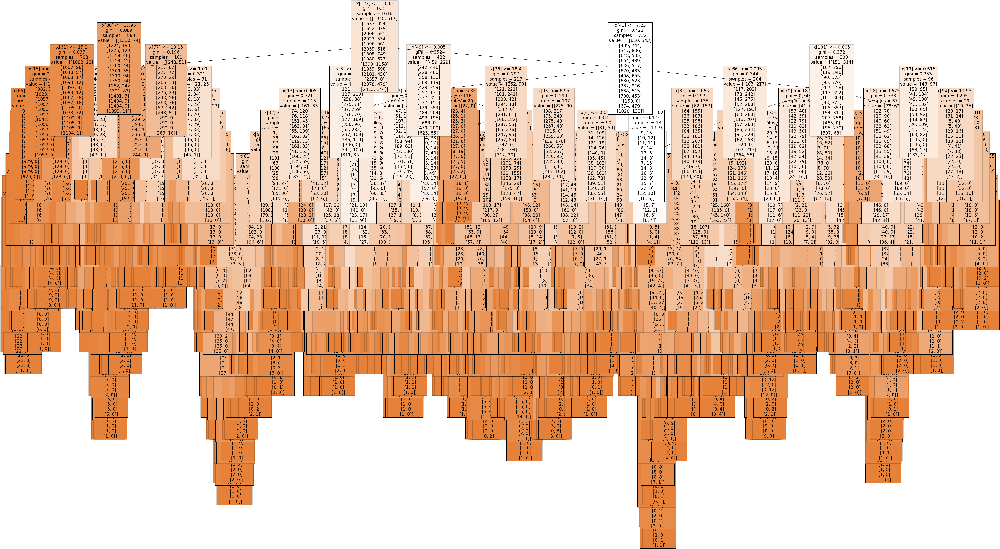

In [18]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[15], fontsize=20, class_names=predictions, filled=True)
plt.show()

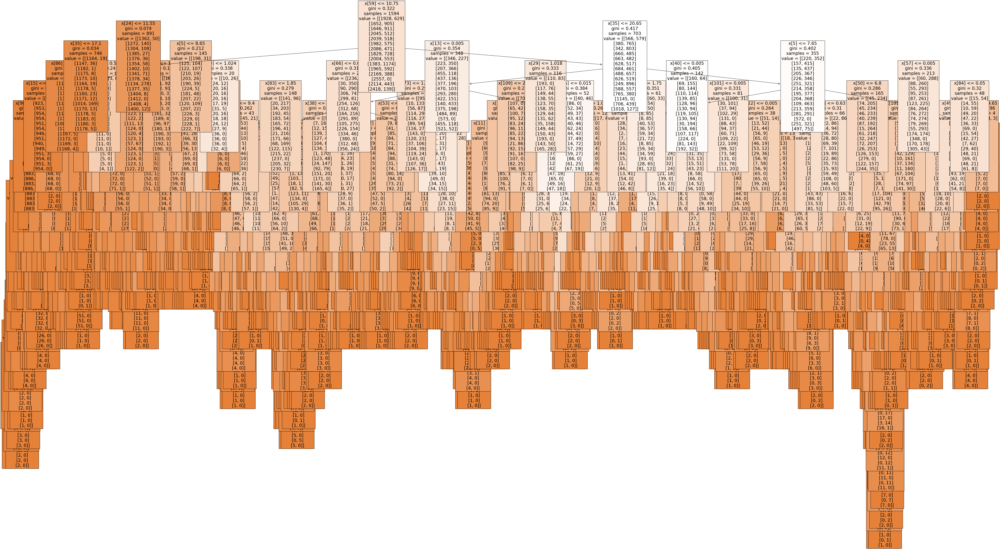

In [19]:
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[80], fontsize=20, class_names=predictions, filled=True)
plt.show()

## 04. Find which weather stations have the most influence

In [20]:
np.set_printoptions(threshold=np.inf)
newarray = clf.feature_importances_
#print(clf.feature_importances_.shape)
newarray

array([0.00179877, 0.00311897, 0.00291964, 0.00497293, 0.01583154,
       0.0076954 , 0.01603913, 0.00518398, 0.02677556, 0.00321716,
       0.00398314, 0.00324381, 0.00359788, 0.01546105, 0.00428411,
       0.00527454, 0.00324686, 0.00945353, 0.00309555, 0.0039672 ,
       0.00340578, 0.00405855, 0.01058956, 0.00481858, 0.02175571,
       0.00308598, 0.01837711, 0.0041409 , 0.00268258, 0.00508213,
       0.00314623, 0.01438772, 0.00523279, 0.00717877, 0.00241531,
       0.0125198 , 0.00702739, 0.00287878, 0.0046213 , 0.00609445,
       0.01626078, 0.0086493 , 0.01980375, 0.00263442, 0.03587878,
       0.00210506, 0.00338363, 0.00385818, 0.00395693, 0.00787841,
       0.00368837, 0.0069221 , 0.00291792, 0.01225695, 0.00438628,
       0.00556052, 0.00357928, 0.01543137, 0.00884799, 0.02806034,
       0.00256013, 0.03428444, 0.00321476, 0.00372395, 0.00311609,
       0.00393302, 0.01365963, 0.0042794 , 0.01375361, 0.00278968,
       0.01008227, 0.00696344, 0.00330979, 0.00389969, 0.00357

In [21]:
np.set_printoptions(threshold=1000)

In [22]:
newarray = newarray.reshape(-1,15,9)
print(newarray.shape)
newarray

(1, 15, 9)


array([[[0.00179877, 0.00311897, 0.00291964, 0.00497293, 0.01583154,
         0.0076954 , 0.01603913, 0.00518398, 0.02677556],
        [0.00321716, 0.00398314, 0.00324381, 0.00359788, 0.01546105,
         0.00428411, 0.00527454, 0.00324686, 0.00945353],
        [0.00309555, 0.0039672 , 0.00340578, 0.00405855, 0.01058956,
         0.00481858, 0.02175571, 0.00308598, 0.01837711],
        [0.0041409 , 0.00268258, 0.00508213, 0.00314623, 0.01438772,
         0.00523279, 0.00717877, 0.00241531, 0.0125198 ],
        [0.00702739, 0.00287878, 0.0046213 , 0.00609445, 0.01626078,
         0.0086493 , 0.01980375, 0.00263442, 0.03587878],
        [0.00210506, 0.00338363, 0.00385818, 0.00395693, 0.00787841,
         0.00368837, 0.0069221 , 0.00291792, 0.01225695],
        [0.00438628, 0.00556052, 0.00357928, 0.01543137, 0.00884799,
         0.02806034, 0.00256013, 0.03428444, 0.00321476],
        [0.00372395, 0.00311609, 0.00393302, 0.01365963, 0.0042794 ,
         0.01375361, 0.00278968, 0.0100822

In [23]:
sumarray = np.sum(newarray[0], axis=1)
sumarray

array([0.08433592, 0.05176208, 0.07315402, 0.05678622, 0.10384895,
       0.04696755, 0.10592511, 0.06230109, 0.10178457, 0.0650536 ,
       0.07865779, 0.06294362, 0.03011432, 0.04844828, 0.02791688])

In [60]:
important = pd.Series(sumarray, index = cities).sort_values(ascending = False)
important

Kassel       0.11
Dusseldorf   0.10
Maastricht   0.10
Basel        0.08
Munchenb     0.08
Budapest     0.07
Madrid       0.07
Oslo         0.06
Ljubljana    0.06
Debilt       0.06
Belgrade     0.05
Stockholm    0.05
Heathrow     0.05
Sonnblick    0.03
Valentia     0.03
dtype: float64

['cloud_cover', 'humidity', 'pressure', 'global_radiation', 'precipitation', 'sunshine', 'temp_mean', 'temp_min', 'temp_max']


Text(0.5, 1.0, 'Locations Importances')

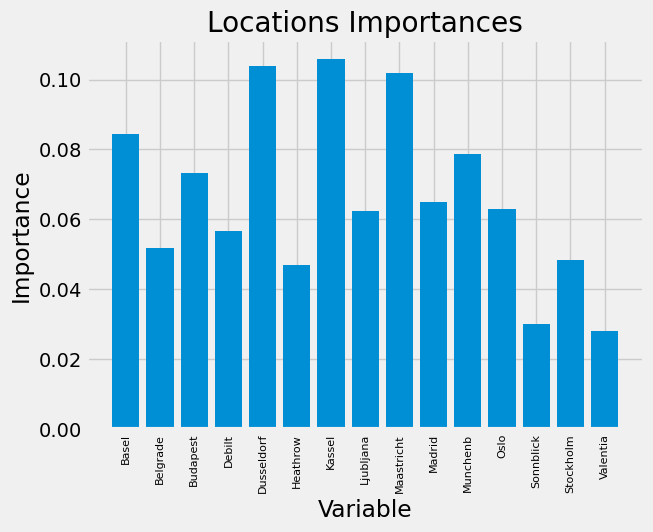

In [25]:
# Conduct variable importances by most influential weather station (broad analysis)
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important)))
print(observations)

plt.bar(x_values, important, orientation = 'vertical')
plt.xticks(x_values, cities, rotation = 'vertical', fontsize = 8)
plt.ylabel('Importance'); plt.xlabel('Variable'); plt.title('Locations Importances')

#### Notes: As shown in the graph, Dusseldorf, Maastricht and Kassel are the top 3 stations have the most influence on how the random forest divides up data.

## 05. Create three subsets of original data set (including all decades): One subset for each of the top important stations 

In [26]:
#recall the original dataframes
climate

,Unnamed: 0,DATE,MONTH,BASEL_cloud_cover,BASEL_humidity,BASEL_pressure,BASEL_global_radiation,BASEL_precipitation,BASEL_sunshine,BASEL_temp_mean,BASEL_temp_min,BASEL_temp_max,BELGRADE_cloud_cover,BELGRADE_humidity,BELGRADE_pressure,BELGRADE_global_radiation,BELGRADE_precipitation,BELGRADE_sunshine,BELGRADE_temp_mean,BELGRADE_temp_min,BELGRADE_temp_max,BUDAPEST_cloud_cover,BUDAPEST_humidity,BUDAPEST_pressure,BUDAPEST_global_radiation,BUDAPEST_precipitation,BUDAPEST_sunshine,BUDAPEST_temp_mean,BUDAPEST_temp_min,BUDAPEST_temp_max,DEBILT_cloud_cover,DEBILT_humidity,DEBILT_pressure,DEBILT_global_radiation,DEBILT_precipitation,DEBILT_sunshine,DEBILT_temp_mean,DEBILT_temp_min,DEBILT_temp_max,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max,HEATHROW_cloud_cover,HEATHROW_humidity,HEATHROW_pressure,HEATHROW_global_radiation,HEATHROW_precipitation,HEATHROW_sunshine,HEATHROW_temp_mean,HEATHROW_temp_min,HEATHROW_temp_max,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,LJUBLJANA_cloud_cover,LJUBLJANA_humidity,LJUBLJANA_pressure,LJUBLJANA_global_radiation,LJUBLJANA_precipitation,LJUBLJANA_sunshine,LJUBLJANA_temp_mean,LJUBLJANA_temp_min,LJUBLJANA_temp_max,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max,MADRID_cloud_cover,MADRID_humidity,MADRID_pressure,MADRID_global_radiation,MADRID_precipitation,MADRID_sunshine,MADRID_temp_mean,MADRID_temp_min,MADRID_temp_max,MUNCHENB_cloud_cover,MUNCHENB_humidity,MUNCHENB_global_radiation,MUNCHENB_precipitation,MUNCHENB_sunshine,MUNCHENB_temp_mean,MUNCHENB_temp_min,MUNCHENB_temp_max,OSLO_cloud_cover,OSLO_humidity,OSLO_pressure,OSLO_global_radiation,OSLO_precipitation,OSLO_sunshine,OSLO_temp_mean,OSLO_temp_min,OSLO_temp_max,SONNBLICK_cloud_cover,SONNBLICK_humidity,SONNBLICK_pressure,SONNBLICK_global_radiation,SONNBLICK_precipitation,SONNBLICK_sunshine,SONNBLICK_temp_mean,SONNBLICK_temp_min,SONNBLICK_temp_max,STOCKHOLM_cloud_cover,STOCKHOLM_pressure,STOCKHOLM_global_radiation,STOCKHOLM_precipitation,STOCKHOLM_sunshine,STOCKHOLM_temp_mean,STOCKHOLM_temp_min,STOCKHOLM_temp_max,VALENTIA_cloud_cover,VALENTIA_humidity,VALENTIA_pressure,VALENTIA_global_radiation,VALENTIA_precipitation,VALENTIA_sunshine,VALENTIA_temp_mean,VALENTIA_temp_min,VALENTIA_temp_max,KASSEL_cloud_cover,MUNCHENB_pressure,STOCKHOLM_humidity
0,0,19600101,1,7,0.85,1.02,0.32,0.09,0.70,6.50,0.80,10.90,1,0.81,1.02,0.88,0.00,7.00,3.70,-0.90,7.90,4,0.67,1.02,0.44,0.01,2.30,2.40,-0.40,5.10,7,0.85,1.00,0.07,0.25,0.00,9.30,7.40,11.00,8,0.83,1.02,0.12,0.08,0.00,10.00,7.00,11.50,7,0.91,1.00,0.13,0.22,0.00,10.60,9.40,8.30,0.82,1.01,0.28,0.48,1.60,7.90,3.90,9.40,8,1.00,1.02,0.20,0.00,0.00,-0.60,-1.90,0.50,7,0.83,1.01,0.22,0.32,1.00,9.50,8.50,11.10,6,0.92,1.03,0.53,0.00,1.40,7.60,4.40,10.80,5,0.67,0.20,0.10,0.00,6.90,1.10,10.40,8,0.98,1.00,0.04,1.14,0.00,4.90,3.80,5.90,4,0.73,1.03,0.48,0.01,2.30,-5.90,-8.50,-3.20,5,1.01,0.05,0.32,0.00,4.20,2.20,4.90,5,0.88,1.00,0.45,0.34,4.70,8.50,6.00,10.90,8,1.03,0.98
1,1,19600102,1,6,0.84,1.02,0.36,1.05,1.10,6.10,3.30,10.10,6,0.84,1.02,0.25,0.00,0.00,2.90,2.20,4.40,4,0.67,1.02,0.18,0.31,0.00,2.30,1.40,3.10,8,0.90,1.01,0.14,0.06,0.10,7.70,6.40,8.30,8,0.89,1.02,0.18,0.66,0.50,8.20,7.40,11.00,7,0.98,1.01,0.13,0.23,0.00,6.10,3.90,10.60,0.86,1.01,0.12,0.27,0.00,7.70,6.80,9.10,6,0.94,1.02,0.56,0.13,3.20,2.10,-1.30,5.50,8,0.92,1.01,0.17,1.34,0.40,8.60,7.50,9.90,7,0.86,1.03,0.46,0.00,0.90,9.80,7.40,12.20,6,0.72,0.61,0.30,5.10,6.20,4.20,10.20,8,0.62,1.01,0.04,0.00,0.00,3.40,2.80,4.90,6,0.97,1.03,0.21,0.61,0.00,-9.50,-10.50,-8.50,5,1.01,0.05,0.06,0.00,4.00,3.00,5.00,7,0.91,1.00,0.25,0.84,0.70,8.90,5.60,12.10,6,1.03,0.62
2,2,19600103,1,8,0.90,1.02,0.

In [27]:
pleasant

,DATE,BASEL_pleasant_weather,BELGRADE_pleasant_weather,BUDAPEST_pleasant_weather,DEBILT_pleasant_weather,DUSSELDORF_pleasant_weather,HEATHROW_pleasant_weather,KASSEL_pleasant_weather,LJUBLJANA_pleasant_weather,MAASTRICHT_pleasant_weather,MADRID_pleasant_weather,MUNCHENB_pleasant_weather,OSLO_pleasant_weather,SONNBLICK_pleasant_weather,STOCKHOLM_pleasant_weather,VALENTIA_pleasant_weather
0,19600101,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,19600102,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,19600103,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,19600104,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,19600105,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22945,20221027,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22946,20221028,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22947,20221029,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
22948,20221030,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### 5.1 Creat a subset for Dusseldorf

In [28]:
climate_dusseldorf = climate.filter(like='DUSSELDORF') 
climate_dusseldorf

,DUSSELDORF_cloud_cover,DUSSELDORF_humidity,DUSSELDORF_pressure,DUSSELDORF_global_radiation,DUSSELDORF_precipitation,DUSSELDORF_sunshine,DUSSELDORF_temp_mean,DUSSELDORF_temp_min,DUSSELDORF_temp_max
0,8,0.83,1.02,0.12,0.08,0.00,10.00,7.00,11.50
1,8,0.89,1.02,0.18,0.66,0.50,8.20,7.40,11.00
2,7,0.95,1.02,0.12,0.07,0.00,7.10,6.90,9.10
3,8,0.86,1.02,0.12,0.02,0.00,6.80,3.60,8.00
4,7,0.92,1.02,0.12,0.62,0.00,7.70,6.20,11.00
...,...,...,...,...,...,...,...,...,...
22945,8,0.75,1.02,1.13,0.20,6.40,17.80,13.60,21.40
22946,7,0.71,1.02,1.13,0.20,4.90,19.40,15.40,23.90
22947,8,0.73,1.02,1.13,0.20,4.00,18.20,13.40,22.00
22948,7,0.73,1.02,1.13,0.20,6.90,16.70,11.90,21.10


In [29]:
pleasant_dusseldorf = pleasant.filter(like='DUSSELDORF') 
pleasant_dusseldorf

,DUSSELDORF_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [30]:
# Check value counts for Dusseldorf pleasant weather data.

pleasant_dusseldorf['DUSSELDORF_pleasant_weather'].value_counts(dropna=False)

DUSSELDORF_pleasant_weather
0    18016
1     4934
Name: count, dtype: int64

### 5.2 Creat a subset for Maastricht

In [31]:
climate_maastricht = climate.filter(like='MAASTRICHT') 
climate_maastricht

,MAASTRICHT_cloud_cover,MAASTRICHT_humidity,MAASTRICHT_pressure,MAASTRICHT_global_radiation,MAASTRICHT_precipitation,MAASTRICHT_sunshine,MAASTRICHT_temp_mean,MAASTRICHT_temp_min,MAASTRICHT_temp_max
0,7,0.83,1.01,0.22,0.32,1.00,9.50,8.50,11.10
1,8,0.92,1.01,0.17,1.34,0.40,8.60,7.50,9.90
2,7,0.97,1.02,0.12,0.46,0.00,6.90,5.50,9.90
3,7,0.89,1.03,0.16,0.00,0.30,7.00,3.00,10.00
4,7,0.92,1.03,0.12,0.56,0.00,8.10,2.50,11.10
...,...,...,...,...,...,...,...,...,...
22945,8,0.67,1.02,1.17,0.20,5.30,18.60,14.10,22.60
22946,7,0.70,1.02,1.17,0.20,5.00,18.90,15.80,23.50
22947,8,0.69,1.02,1.17,0.20,3.20,18.20,13.70,24.30
22948,8,0.73,1.02,1.17,0.20,6.80,16.30,12.80,21.40


In [32]:
pleasant_maastricht = pleasant.filter(like='MAASTRICHT') 
pleasant_maastricht

,MAASTRICHT_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [33]:
# Check value counts for Maastricht pleasant weather data.

pleasant_maastricht['MAASTRICHT_pleasant_weather'].value_counts(dropna=False)

MAASTRICHT_pleasant_weather
0    18184
1     4766
Name: count, dtype: int64

### 5.3 Creat a subset for Kassel

In [44]:
climate_kassel = climate.filter(like='KASSEL') 
climate_kassel

,KASSEL_humidity,KASSEL_pressure,KASSEL_global_radiation,KASSEL_precipitation,KASSEL_sunshine,KASSEL_temp_mean,KASSEL_temp_min,KASSEL_temp_max,KASSEL_cloud_cover
0,0.82,1.01,0.28,0.48,1.60,7.90,3.90,9.40,8
1,0.86,1.01,0.12,0.27,0.00,7.70,6.80,9.10,6
2,0.91,1.01,0.12,0.60,0.00,6.50,6.00,8.00,8
3,0.87,1.03,0.12,0.00,0.00,5.80,5.20,6.50,6
4,0.86,1.03,0.13,0.71,0.00,5.40,3.70,6.00,7
...,...,...,...,...,...,...,...,...,...
22945,0.77,1.02,1.14,0.19,4.00,9.10,5.40,13.10,4
22946,0.77,1.02,1.14,0.19,4.00,9.10,5.40,13.10,3
22947,0.77,1.02,1.14,0.19,4.00,9.10,5.40,13.10,3
22948,0.77,1.02,1.14,0.19,4.00,9.10,5.40,13.10,3


In [45]:
pleasant_kassel = pleasant.filter(like='KASSEL') 
pleasant_kassel

,KASSEL_pleasant_weather
0,0
1,0
2,0
3,0
4,0
...,...
22945,0
22946,0
22947,0
22948,0


In [46]:
# Check value counts for KASSEL pleasant weather data.

pleasant_kassel['KASSEL_pleasant_weather'].value_counts(dropna=False)

KASSEL_pleasant_weather
0    19176
1     3774
Name: count, dtype: int64

## 06. Create another random forest model for each of the 3 stations

### 6.1 Dusseldorf

In [37]:
# Split into training and testing sets.

X_train_duss, X_test_duss, y_train_duss, y_test_duss = train_test_split(climate_dusseldorf,pleasant_dusseldorf,test_size=0.3)

In [38]:
# Check shapes of training and test sets for Dusseldorf data

print(X_train_duss.shape, y_train_duss.shape)
print(X_test_duss.shape, y_test_duss.shape)

(16065, 9) (16065, 1)
(6885, 9) (6885, 1)


In [39]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train_duss, y_train_duss)

C:\Users\Quinn\AppData\Local\Temp\ipykernel_22020\1289437065.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train_duss, y_train_duss)


RandomForestClassifier()

In [40]:
# performing predictions on the test dataset
y_pred_duss = clf.predict(X_test_duss)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_duss, y_pred_duss))

Model Accuracy:  1.0


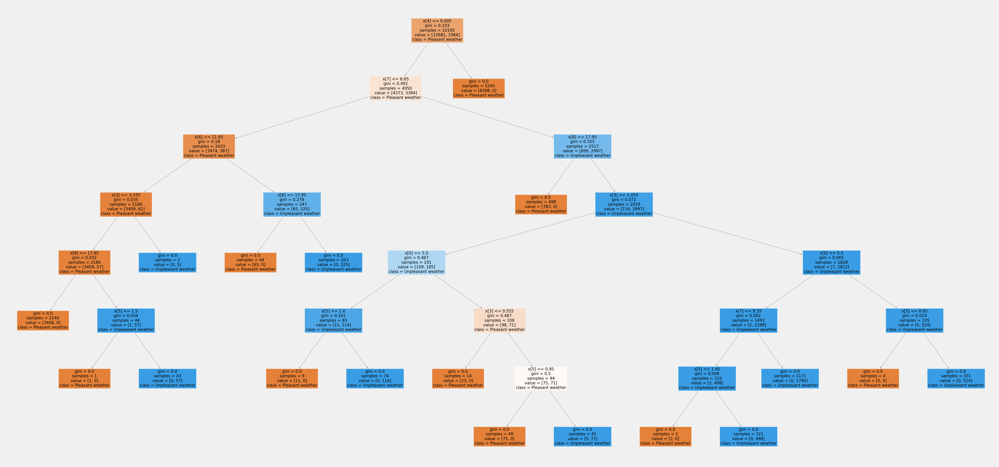

In [41]:
# Plot the random forest
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[15], fontsize=20, class_names=predictions, filled=True)
plt.show()

In [42]:
# Create a list of feature importances for Dusseldorf.
important_dusseldorf = pd.Series(clf.feature_importances_, index = climate_dusseldorf.columns).sort_values(ascending = False)
important_dusseldorf

DUSSELDORF_precipitation      0.35
DUSSELDORF_temp_max           0.27
DUSSELDORF_temp_mean          0.15
DUSSELDORF_global_radiation   0.07
DUSSELDORF_sunshine           0.07
DUSSELDORF_cloud_cover        0.04
DUSSELDORF_temp_min           0.01
DUSSELDORF_humidity           0.01
DUSSELDORF_pressure           0.01
dtype: float64

['precipitation', 'temp_max', 'temp_mean', 'global_radiation', 'sunshine', 'cloud_cover', 'temp_min', 'humidity', 'pressure']


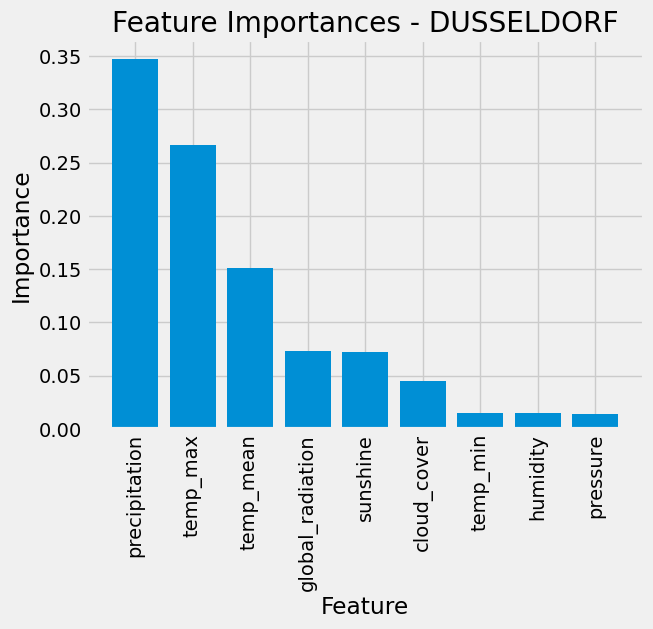

In [43]:
# Conduct variable importances by most influential feature
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_dusseldorf)))
observations_1 = [feature.replace('DUSSELDORF_', '') for feature in important_dusseldorf.index.tolist()]
print(observations_1)

plt.bar(x_values, important_dusseldorf, orientation = 'vertical')
plt.xticks(x_values, observations_1, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Feature Importances - DUSSELDORF');

#### For Dusseldorf, the most importance features are precipitation, temp_max and temp_mean.

### 6.1 Maastricht

In [47]:
# Split into training and testing sets.

X_train_maas, X_test_maas, y_train_maas, y_test_maas = train_test_split(climate_maastricht,pleasant_maastricht,test_size=0.3)

In [48]:
# Check shapes of training and test sets for Dusseldorf data

print(X_train_maas.shape, y_train_maas.shape)
print(X_test_maas.shape, y_test_maas.shape)

(16065, 9) (16065, 1)
(6885, 9) (6885, 1)


In [49]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train_maas, y_train_maas)

C:\Users\Quinn\AppData\Local\Temp\ipykernel_22020\486781476.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train_maas, y_train_maas)


RandomForestClassifier()

In [50]:
# performing predictions on the test dataset
y_pred_maas = clf.predict(X_test_maas)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_maas, y_pred_maas))

Model Accuracy:  1.0


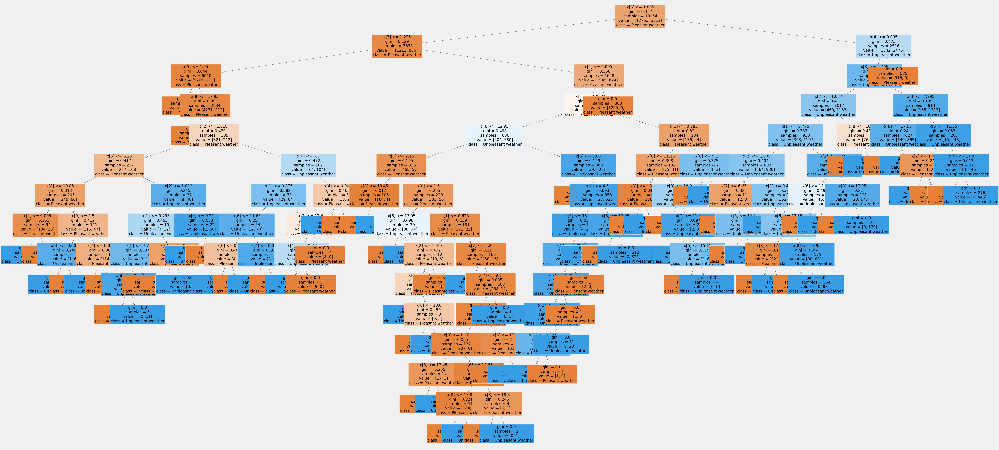

In [51]:
# Plot the random forest
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[15], fontsize=20, class_names=predictions, filled=True)
plt.show()

In [52]:
# Create a list of feature importances for Dusseldorf.
important_maastricht = pd.Series(clf.feature_importances_, index = climate_maastricht.columns).sort_values(ascending = False)
important_maastricht

MAASTRICHT_precipitation      0.31
MAASTRICHT_temp_max           0.29
MAASTRICHT_temp_mean          0.14
MAASTRICHT_global_radiation   0.09
MAASTRICHT_sunshine           0.07
MAASTRICHT_cloud_cover        0.04
MAASTRICHT_temp_min           0.03
MAASTRICHT_humidity           0.02
MAASTRICHT_pressure           0.01
dtype: float64

['precipitation', 'temp_max', 'temp_mean', 'global_radiation', 'sunshine', 'cloud_cover', 'temp_min', 'humidity', 'pressure']


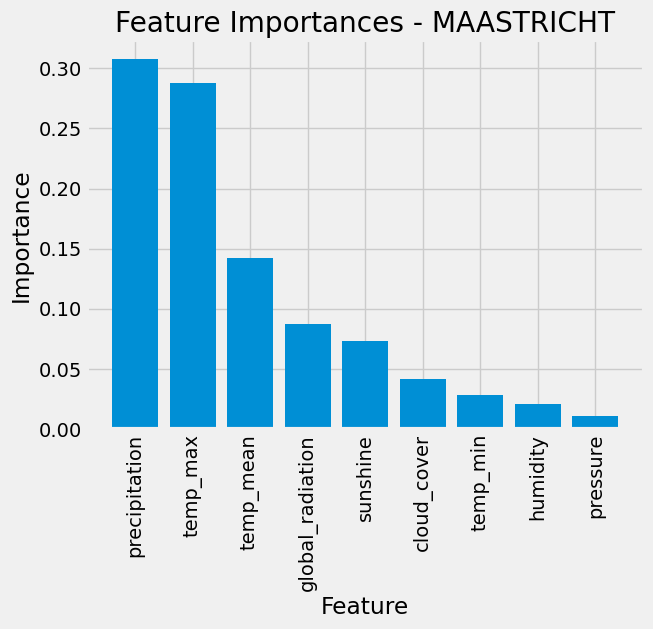

In [53]:
# Conduct variable importances by most influential feature
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_dusseldorf)))
observations_2 = [feature.replace('MAASTRICHT_', '') for feature in important_maastricht.index.tolist()]
print(observations_2)

plt.bar(x_values, important_maastricht, orientation = 'vertical')
plt.xticks(x_values, observations_2, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Feature Importances - MAASTRICHT');

#### For Maastricht, the accuracy is 100%. Precipitation, maximum and mean temperature have the most influence on how the random forest divides up data

### 6.1 Kassel

In [54]:
# Split into training and testing sets.

X_train_kas, X_test_kas, y_train_kas, y_test_kas = train_test_split(climate_kassel,pleasant_kassel,test_size=0.3)

In [55]:
# Check shapes of training and test sets for Dusseldorf data

print(X_train_kas.shape, y_train_kas.shape)
print(X_test_kas.shape, y_test_kas.shape)

(16065, 9) (16065, 1)
(6885, 9) (6885, 1)


In [56]:
# Creating a RF classifier
clf = RandomForestClassifier(n_estimators = 100)#, max_depth=5)  
  
# Training the model on the training dataset
# fit function is used to train the model using the training sets as parameters
clf.fit(X_train_kas, y_train_kas)

C:\Users\Quinn\AppData\Local\Temp\ipykernel_22020\13914913.py:6: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  clf.fit(X_train_kas, y_train_kas)


RandomForestClassifier()

In [57]:
# performing predictions on the test dataset
y_pred_kas = clf.predict(X_test_kas)
  
# using metrics module for accuracy calculation
print("Model Accuracy: ", metrics.accuracy_score(y_test_kas, y_pred_kas))

Model Accuracy:  1.0


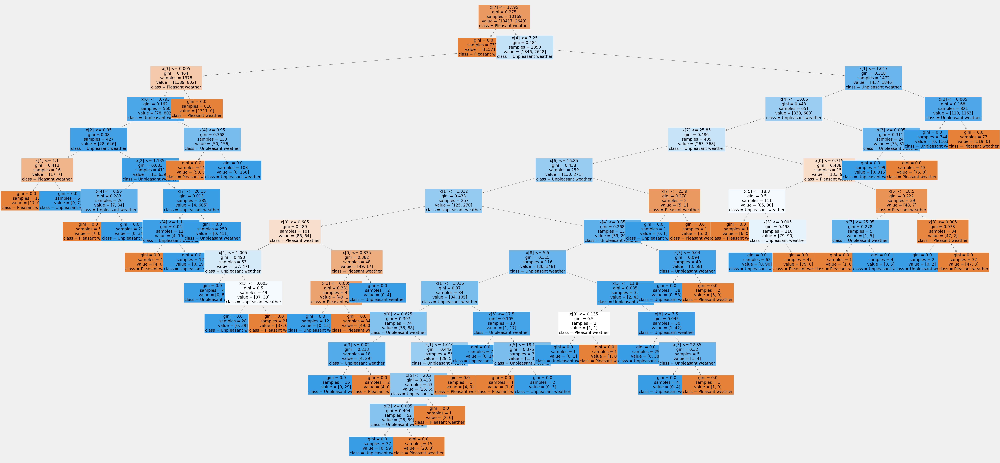

In [58]:
# Plot the random forest
fig = plt.figure(figsize=(80, 40))
plot_tree(clf.estimators_[15], fontsize=20, class_names=predictions, filled=True)
plt.show()

In [59]:
# Create a list of feature importances for Dusseldorf.
important_kassel = pd.Series(clf.feature_importances_, index = climate_kassel.columns).sort_values(ascending = False)
important_kassel

KASSEL_precipitation      0.34
KASSEL_temp_max           0.28
KASSEL_temp_mean          0.15
KASSEL_sunshine           0.08
KASSEL_global_radiation   0.08
KASSEL_humidity           0.03
KASSEL_pressure           0.02
KASSEL_temp_min           0.01
KASSEL_cloud_cover        0.00
dtype: float64

['precipitation', 'temp_max', 'temp_mean', 'sunshine', 'global_radiation', 'humidity', 'pressure', 'temp_min', 'cloud_cover']


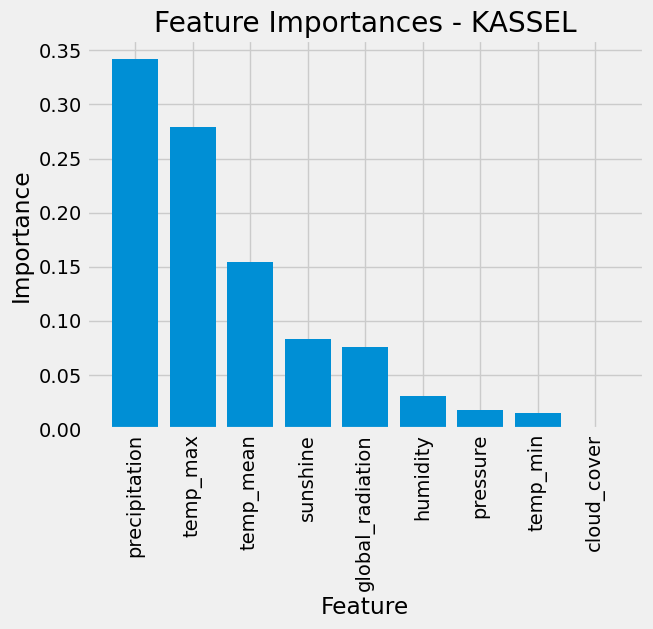

In [61]:
# Conduct variable importances by most influential feature
%matplotlib inline

plt.style.use('fivethirtyeight')
# list of x locations for plotting
x_values = list(range(len(important_dusseldorf)))
observations_3 = [feature.replace('KASSEL_', '') for feature in important_kassel.index.tolist()]
print(observations_3)

plt.bar(x_values, important_kassel, orientation = 'vertical')
plt.xticks(x_values, observations_3, rotation='vertical')
plt.ylabel('Importance'); plt.xlabel('Feature'); plt.title('Feature Importances - KASSEL');

#### For Kassel, the accuracy is 100%. Precipitation, maximum and mean temperature also have the most influence on how the random forest divides up data

#### Overall, precipitation, maximum and mean temperature from Maastricht, Dusserdoft and Kassel might be more important in terms of predicting future weather events. Investing in advanced climate-tracking equipment that focuses on these parameters would enhance predictive capabilities of weather conditions